In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
%matplotlib inline 
from matplotlib import pyplot as plt
plt.style.use('dark_background')

# Data Preprocessing

## Learn the CSV

In [2]:
accs = pd.read_csv('US_Accidents_March23_sampled_500k.csv')

In [3]:
sample=accs.sample(100000)
sample

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
107154,A-2833546,Source2,3,2018-05-18 12:14:31,2018-05-18 12:59:03,32.662308,-96.822899,NaN,NaN,0.000,...,False,False,False,False,False,False,Day,Day,Day,Day
162533,A-7340589,Source1,2,2019-10-14 06:43:00,2019-10-14 08:38:04,36.960798,-121.550897,36.960798,-121.550897,0.000,...,False,False,False,False,False,False,Night,Night,Day,Day
27391,A-6316735,Source1,2,2021-11-18 12:17:12,2021-11-18 14:17:53,46.288831,-93.824836,46.290106,-93.825202,0.090,...,False,False,False,False,False,False,Day,Day,Day,Day
448692,A-2230043,Source2,2,2019-03-20 17:18:04,2019-03-20 19:12:38,40.615108,-122.519508,NaN,NaN,0.000,...,False,False,False,False,False,False,Day,Day,Day,Day
265137,A-1025382,Source3,2,2021-05-29 19:19:04,2021-05-29 20:33:19,32.834728,-96.898125,NaN,NaN,0.000,...,False,False,False,False,False,False,Day,Day,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236309,A-5898746,Source1,2,2021-05-29 19:32:00,2021-05-29 22:56:02,36.327249,-119.343935,36.327259,-119.339295,0.258,...,False,False,False,False,False,False,Day,Day,Day,Day
146516,A-5133453,Source1,2,2022-08-06 11:36:00.000000000,2022-08-06 13:48:00.000000000,32.802873,-96.626514,32.843128,-96.634243,2.817,...,False,False,False,False,False,False,Day,Day,Day,Day
463507,A-263099,Source2,2,2016-12-08 18:52:43,2016-12-08 19:22:30,29.837557,-95.371597,NaN,NaN,0.010,...,False,False,False,False,True,False,Night,Night,Night,Night
119362,A-438533,Source2,3,2017-05-07 16:37:06,2017-05-07 17:21:15,34.065979,-118.216400,NaN,NaN,0.010,...,False,False,False,False,False,False,Day,Day,Day,Day


In [6]:
sample.dtypes

ID                        object
Source                    object
Severity                   int64
Start_Time                object
End_Time                  object
Start_Lat                float64
Start_Lng                float64
End_Lat                  float64
End_Lng                  float64
Distance(mi)             float64
Description               object
Street                    object
City                      object
County                    object
State                     object
Zipcode                   object
Country                   object
Timezone                  object
Airport_Code              object
Weather_Timestamp         object
Temperature(F)           float64
Wind_Chill(F)            float64
Humidity(%)              float64
Pressure(in)             float64
Visibility(mi)           float64
Wind_Direction            object
Wind_Speed(mph)          float64
Precipitation(in)        float64
Weather_Condition         object
Amenity                     bool
Bump      

In [5]:
sample.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [5]:
sample.tail()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
162432,A-1807774,Source2,2,2019-11-08 08:54:59,2019-11-08 09:54:42,42.166309,-88.062759,NaN,NaN,0.00,...,False,False,False,False,True,False,Day,Day,Day,Day
30418,A-2856533,Source2,2,2018-05-30 00:55:14,2018-05-30 01:26:00,39.758423,-105.015823,NaN,NaN,0.00,...,False,False,False,False,True,False,Night,Night,Night,Night
469588,A-3045122,Source2,2,2018-01-04 08:41:51,2018-01-04 09:11:19,39.020977,-77.424103,NaN,NaN,0.00,...,False,False,False,False,True,False,Day,Day,Day,Day
238236,A-3170007,Source2,3,2017-11-06 11:45:06,2017-11-06 12:14:44,32.795120,-97.321526,NaN,NaN,0.00,...,False,False,False,False,True,False,Day,Day,Day,Day
236194,A-4213734,Source1,2,2022-09-16 18:56:00,2022-09-16 20:11:07,30.227544,-85.662442,30.226248,-85.662491,0.09,...,False,False,False,False,False,False,Night,Day,Day,Day


# Specific columns so that we see what they are saying

In [6]:
sample.loc[:, 'Description']

131090      Crash on Rockwell Ave Northbound at Landing Rd.
482190      At RT-24/Exit 48 - Accident. Left lane blocked.
42622     Shoulder blocked due to accident on TN-153 Nor...
482670    Incident on I-10 WB near TEMPLE CITY BLVD Road...
334294    Lane blocked due to accident on NC-27 Albemarl...
                                ...                        
108828                  Accident on Person St at Branch St.
68231     Entry ramp to I-95 Southbound from Forest Hill...
135144                          At Six Forks Rd - Accident.
238290                At CR-1200/E Highland Ave - Accident.
63192     One lane blocked due to accident on I-635 East...
Name: Description, Length: 100000, dtype: object

In [7]:
sample.loc[:, 'Street']

131090      N Rockwell Ave
482190              I-78 E
42622             TN-153 S
482670              I-10 W
334294        Farm Pond Ln
                ...       
108828           Branch St
68231               I-95 S
135144        Six Forks Rd
238290       S Highway 395
63192     Harry Hines Blvd
Name: Street, Length: 100000, dtype: object

In [8]:
sample.loc[:, 'Wind_Direction']

131090     WNW
482190     SSW
42622       NE
482670    CALM
334294       N
          ... 
108828      NE
68231      NNW
135144     WSW
238290      NW
63192        E
Name: Wind_Direction, Length: 100000, dtype: object

In [9]:
sample.loc[:, 'Traffic_Signal'].value_counts()

Traffic_Signal
False    85051
True     14949
Name: count, dtype: int64

In [10]:
sample.loc[:, 'Traffic_Calming'].value_counts()

Traffic_Calming
False    99902
True        98
Name: count, dtype: int64

In [11]:
sample.loc[:, 'Visibility(mi)'].value_counts()

Visibility(mi)
10.00     78422
7.00       2776
9.00       2466
8.00       1946
5.00       1928
6.00       1644
2.00       1610
4.00       1566
3.00       1537
1.00       1321
0.50        466
0.25        374
0.75        252
2.50        231
1.50        164
0.20        164
13.00       130
0.80        118
1.80        115
0.00         94
1.20         91
15.00        71
20.00        43
30.00        42
0.12         34
40.00        24
50.00        22
0.10         13
25.00        13
45.00         7
0.88          6
0.63          5
0.06          5
0.38          5
75.00         4
60.00         3
80.00         3
12.00         3
35.00         3
2.80          2
2.20          2
120.00        1
70.00         1
54.00         1
23.00         1
1.40          1
11.00         1
4.20          1
5.50          1
0.40          1
0.60          1
0.19          1
Name: count, dtype: int64

# Dealing with the missing values

In [13]:
# missing values per column
sample.isna().sum()

ID                           0
Source                       0
Severity                     0
Start_Time                   0
End_Time                     0
Start_Lat                    0
Start_Lng                    0
End_Lat                  44031
End_Lng                  44031
Distance(mi)                 0
Description                  0
Street                     144
City                         2
County                       0
State                        0
Zipcode                     28
Country                      0
Timezone                    86
Airport_Code               266
Weather_Timestamp         1582
Temperature(F)            2131
Wind_Chill(F)            25784
Humidity(%)               2256
Pressure(in)              1841
Visibility(mi)            2300
Wind_Direction            2273
Wind_Speed(mph)           7409
Precipitation(in)        28644
Weather_Condition         2246
Amenity                      0
Bump                         0
Crossing                     0
Give_Way

In [14]:
# duplicates
sample.duplicated().sum()

0

In [7]:
# description of numeric features 
sample.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,100000.000000,100000.000000,100000.000000,56210.000000,56210.000000,100000.000000,97856.000000,74296.000000,97734.000000,98155.000000,97698.000000,92606.000000,71561.000000
mean,2.213040,36.207386,-94.704439,36.274866,-95.700040,0.562885,61.653936,58.255786,64.873944,29.534772,9.090551,7.689577,0.008552
std,0.486041,5.076495,17.404748,5.264676,18.099353,1.764611,18.943702,22.271635,22.842924,1.010840,2.688496,5.285681,0.103911
min,1.000000,24.574326,-124.466380,24.574546,-124.467650,0.000000,-28.000000,-53.200000,2.000000,19.360000,0.000000,0.000000,0.000000
25%,2.000000,33.406340,-117.223242,33.465863,-117.731987,0.000000,49.000000,43.000000,48.000000,29.370000,10.000000,4.600000,0.000000
50%,2.000000,35.834196,-87.732308,36.172016,-88.002356,0.030000,64.000000,62.000000,67.000000,29.850000,10.000000,7.000000,0.000000
75%,2.000000,40.098356,-80.353545,40.196810,-80.248088,0.471000,76.000000,75.000000,84.000000,30.030000,10.000000,10.400000,0.000000
max,4.000000,48.991585,-68.298310,48.998901,-68.315081,149.687000,115.000000,114.000000,100.000000,31.120000,100.000000,47.000000,10.130000


In [15]:
# accidents by City
accs_city = sample['City'].value_counts()
accs_city

City
Miami          2451
Houston        2176
Los Angeles    2067
Charlotte      1811
Dallas         1720
               ... 
Dafter            1
Rexburg           1
Churubusco        1
Dubberly          1
Deep Run          1
Name: count, Length: 6379, dtype: int64

In [16]:
#accidents by State
accs_state = sample['State'].value_counts()
accs_state

State
CA    22678
FL    11384
TX     7517
SC     4847
NY     4606
NC     4311
PA     3875
VA     3806
MN     2492
OR     2298
GA     2267
AZ     2220
TN     2210
IL     2195
MI     2084
LA     1890
MD     1888
NJ     1785
OH     1544
WA     1435
AL     1366
UT     1311
CO     1185
OK     1045
MO      958
CT      877
IN      850
MA      721
WI      452
NE      408
KY      397
IA      354
MT      354
AR      282
NV      282
DC      263
KS      249
RI      217
MS      189
DE      180
WV      162
ID      157
NM      127
NH      127
WY       54
ME       43
ND       42
VT       14
SD        2
Name: count, dtype: int64

In [17]:
#accidents by Start_Time
accs_time = sample['Start_Time'].value_counts()
accs_time

Start_Time
2021-01-26 16:16:13    9
2021-01-29 02:20:00    5
2020-11-17 13:25:30    4
2021-02-16 06:42:43    4
2021-12-04 14:50:11    3
                      ..
2019-02-08 10:50:49    1
2017-12-19 22:02:50    1
2019-05-07 10:28:46    1
2022-05-03 21:29:37    1
2021-08-03 17:25:37    1
Name: count, Length: 99436, dtype: int64

In [18]:
#accidents by Sun
accs_sun = sample['Sunrise_Sunset'].value_counts()
accs_sun

Sunrise_Sunset
Day      69024
Night    30684
Name: count, dtype: int64

In [19]:
accs_weather = sample['Weather_Condition'].value_counts()
accs_weather

Weather_Condition
Fair                           33252
Mostly Cloudy                  13029
Cloudy                         10663
Clear                          10432
Partly Cloudy                   8951
                               ...  
Light Freezing Rain / Windy        1
Rain Showers                       1
Partial Fog                        1
Hail                               1
Widespread Dust / Windy            1
Name: count, Length: 82, dtype: int64

In [4]:
#fill NaN values using the mean value grouped by state 
End_Lat_op=sample.groupby('State').apply(lambda l: l.End_Lat.mean()).astype(int)
#print(End_Lat_op)
sample.loc[:, 'End_Lat'] = sample.groupby('State', group_keys=False).apply(lambda l: l.End_Lat.fillna(End_Lat_op[l.name]))

End_Lng_op=sample.groupby('State').apply(lambda l: l.End_Lng.mean()).astype(int)
sample.loc[:, 'End_Lng'] = sample.groupby('State', group_keys=False).apply(lambda l: l.End_Lng.fillna(End_Lng_op[l.name]))

Temperature_op = sample.groupby('State')['Temperature(F)'].mean().astype(int)
sample.loc[:, 'Temperature(F)'] = sample.groupby('State', group_keys=False)['Temperature(F)'].apply(lambda l: l.fillna(Temperature_op[l.name]))

Wind_Chill_op = sample.groupby('State')['Wind_Chill(F)'].mean().astype(int)
sample.loc[:, 'Wind_Chill(F)']=sample.groupby('State', group_keys=False)['Wind_Chill(F)'].apply(lambda l: l.fillna(Wind_Chill_op[l.name]))

humidity_op = sample.groupby('State')['Humidity(%)'].mean().astype(int)
sample.loc[:, 'Humidity(%)']=sample.groupby('State', group_keys=False)['Humidity(%)'].apply(lambda l: l.fillna(humidity_op[l.name]))

Pressure_op = sample.groupby('State')['Pressure(in)'].mean().astype(int)
sample.loc[:, 'Pressure(in)']=sample.groupby('State', group_keys=False)['Pressure(in)'].apply(lambda l: l.fillna(Pressure_op[l.name]))

visibility_op = sample.groupby('State')['Visibility(mi)'].mean().astype(int)
sample.loc[:, 'Visibility(mi)']=sample.groupby('State', group_keys=False)['Visibility(mi)'].apply(lambda l: l.fillna(visibility_op[l.name]))

wind_speed_op = sample.groupby('State')['Wind_Speed(mph)'].mean().astype(int)
sample.loc[:, 'Wind_Speed(mph)']=sample.groupby('State', group_keys=False)['Wind_Speed(mph)'].apply(lambda l: l.fillna(wind_speed_op[l.name]))

precipitation_op = sample.groupby('State')['Precipitation(in)'].mean().astype(int)
sample.loc[:, 'Precipitation(in)']=sample.groupby('State', group_keys=False)['Precipitation(in)'].apply(lambda l: l.fillna(precipitation_op[l.name]))

In [5]:
sample = sample.dropna(subset=['Weather_Condition'])
sample = sample.dropna(subset=['Street'])
sample = sample.dropna(subset=['Sunrise_Sunset'])
sample = sample.dropna(subset=['Wind_Direction'])

In [10]:
sample

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
183882,A-795451,Source2,3,2021-12-02 18:33:49,2021-12-02 19:03:24,39.101742,-94.593948,38.000000,-92.000000,0.000,...,False,False,False,False,False,False,Night,Night,Night,Night
53088,A-401637,Source2,2,2017-05-07 13:57:04,2017-05-07 14:56:46,38.563480,-121.341286,35.000000,-119.000000,0.010,...,False,False,False,False,False,False,Day,Day,Day,Day
244497,A-1065230,Source2,2,2021-04-28 15:57:17,2021-04-28 16:26:55,39.479340,-83.899628,40.000000,-83.000000,0.000,...,False,False,False,False,False,False,Day,Day,Day,Day
323515,A-317786,Source2,3,2017-02-01 21:32:11,2017-02-01 22:01:53,34.004791,-118.173012,35.000000,-119.000000,0.010,...,False,False,False,False,False,False,Night,Night,Night,Night
105667,A-7281434,Source1,2,2020-01-03 17:39:39,2020-01-03 18:08:28,26.544487,-81.871387,26.544487,-81.871387,0.000,...,False,False,False,False,False,False,Day,Day,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
480506,A-2061334,Source2,2,2019-06-19 17:32:47,2019-06-19 18:02:11,33.277695,-111.720634,33.000000,-111.000000,0.810,...,False,False,False,False,True,False,Day,Day,Day,Day
95217,A-6857150,Source1,2,2020-11-17 02:33:00,2020-11-17 06:17:09,36.923471,-121.795345,36.911751,-121.785305,0.981,...,False,False,False,False,False,False,Night,Night,Night,Night
116048,A-2194937,Source2,2,2019-04-29 16:53:39,2019-04-29 17:57:09,47.404572,-122.298477,47.000000,-122.000000,0.000,...,False,False,False,False,True,False,Day,Day,Day,Day
255980,A-5642143,Source1,2,2021-08-27 10:28:00,2021-08-27 11:02:30,38.419951,-121.393851,38.412021,-121.390221,0.582,...,False,False,False,False,False,False,Day,Day,Day,Day


# Density

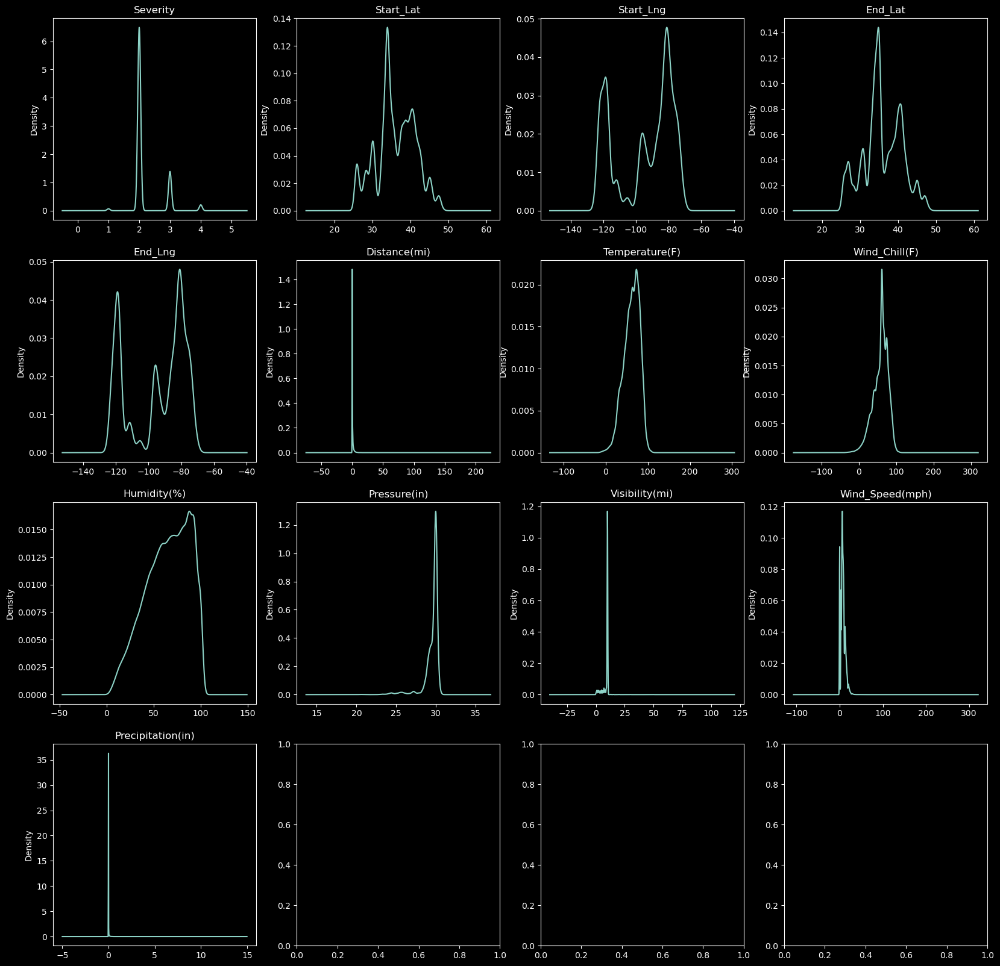

In [26]:
numeric_feats = ['Severity', 'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)']

fig, ax = plt.subplots(4,4, figsize=(20,20))
ax_flat = ax.flatten()

for idx, feat in enumerate(numeric_feats):
    sample[feat].plot.density(ax=ax_flat[idx])
    ax_flat[idx].set_title(feat)

In [6]:
# switch to int
sample['Traffic_Signal'] = sample['Traffic_Signal'].astype('int64')
sample['Traffic_Signal']

107154    0
162533    0
27391     0
448692    0
265137    0
         ..
236309    0
146516    0
463507    1
119362    0
316420    0
Name: Traffic_Signal, Length: 96848, dtype: int64

In [7]:
# One-Hot-Encoding
weather_one_hot_encoded = pd.get_dummies(sample['Weather_Condition'], dtype='int64')
sample.loc[:, weather_one_hot_encoded.columns] = weather_one_hot_encoded
#sample['Weather_Condition']
weather_one_hot_encoded

,Blowing Dust,Blowing Dust / Windy,Blowing Snow,Blowing Snow / Windy,Clear,Cloudy,Cloudy / Windy,Drizzle,Drizzle and Fog,Fair,...,T-Storm,T-Storm / Windy,Thunder,Thunder / Windy,Thunder in the Vicinity,Thunderstorm,Thunderstorms and Rain,Widespread Dust,Wintry Mix,Wintry Mix / Windy
107154,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
162533,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27391,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
448692,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
265137,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236309,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
146516,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
463507,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
119362,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
bump_one_hot_encoded = pd.get_dummies(sample['Bump'], dtype='int64')
bump_one_hot_encoded

,False,True
107154,1,0
162533,1,0
27391,1,0
448692,1,0
265137,1,0
...,...,...
236309,1,0
146516,1,0
463507,1,0
119362,1,0


In [9]:
state_one_hot_encoded = pd.get_dummies(sample['State'], dtype='int64')
sample.loc[:, state_one_hot_encoded.columns] = state_one_hot_encoded
#sample['Weather_Condition']
weather_one_hot_encoded

,Blowing Dust,Blowing Dust / Windy,Blowing Snow,Blowing Snow / Windy,Clear,Cloudy,Cloudy / Windy,Drizzle,Drizzle and Fog,Fair,...,T-Storm,T-Storm / Windy,Thunder,Thunder / Windy,Thunder in the Vicinity,Thunderstorm,Thunderstorms and Rain,Widespread Dust,Wintry Mix,Wintry Mix / Windy
107154,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
162533,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27391,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
448692,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
265137,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236309,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
146516,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
463507,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
119362,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Correlation

In [10]:
numeric_data = sample[['Severity', 'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)','Traffic_Signal', 'Fair', 'Clear', 'Cloudy', 'Fog', 'Bump','CA', 'Snow', 'Rain']]
corr = numeric_data.corr()
corr

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),...,Precipitation(in),Traffic_Signal,Fair,Clear,Cloudy,Fog,Bump,CA,Snow,Rain
Severity,1.000000,0.069733,0.051216,0.063864,0.051672,0.033016,-0.019346,-0.059772,0.019687,0.048101,...,0.016827,-0.108293,-0.122915,0.111772,-0.040733,-0.010335,-0.001947,-0.049672,0.001302,0.010156
Start_Lat,0.069733,1.000000,-0.071224,0.985854,-0.069241,0.065514,-0.446442,-0.513979,0.025668,-0.191495,...,-0.008004,-0.066320,-0.068681,-0.005956,0.064621,0.014199,-0.001831,-0.062624,0.048560,0.005272
Start_Lng,0.051216,-0.071224,1.000000,-0.071210,0.998303,0.007519,-0.006702,-0.038282,0.178136,0.189931,...,0.043679,0.071307,-0.103808,-0.066396,0.037538,-0.005938,-0.012890,-0.770505,0.005699,0.017334
End_Lat,0.063864,0.985854,-0.071210,1.000000,-0.074773,0.073528,-0.444002,-0.514108,0.021642,-0.198634,...,-0.008751,-0.073293,-0.063309,-0.012796,0.068994,0.013473,-0.002754,-0.062736,0.048670,0.005544
End_Lng,0.051672,-0.069241,0.998303,-0.074773,1.000000,0.005251,-0.006743,-0.037907,0.178881,0.190602,...,0.043745,0.075571,-0.106348,-0.064706,0.036186,-0.005793,-0.012616,-0.772888,0.005838,0.017204
Distance(mi),0.033016,0.065514,0.007519,0.073528,0.005251,1.000000,-0.053124,-0.045585,0.008440,-0.095531,...,0.011223,-0.112644,0.039338,-0.058707,0.023677,0.000132,-0.003742,-0.022305,0.048485,0.003686
Temperature(F),-0.019346,-0.446442,-0.006702,-0.444002,-0.006743,-0.053124,1.000000,0.904812,-0.332540,0.111301,...,-0.005052,0.058096,0.079519,0.021382,-0.123286,-0.068143,0.000294,0.059485,-0.086122,-0.029243
Wind_Chill(F),-0.059772,-0.513979,-0.038282,-0.514108,-0.037907,-0.045585,0.904812,1.000000,-0.270940,0.089435,...,-0.000351,0.035479,0.161785,-0.061221,-0.091566,-0.048681,0.001951,0.106171,-0.093731,-0.020373
Humidity(%),0.019687,0.025668,0.178136,0.021642,0.178881,0.008440,-0.332540,-0.270940,1.000000,0.117629,...,0.152176,-0.019977,-0.281631,-0.120936,0.183154,0.157570,-0.003730,-0.142135,0.049282,0.124137
Pressure(in),0.048101,-0.191495,0.189931,-0.198634,0.190602,-0.095531,0.111301,0.089435,0.117629,1.000000,...,-0.002269,0.036878,-0.115573,0.181437,-0.062298,-0.004115,-0.009073,0.050537,-0.053959,-0.003652


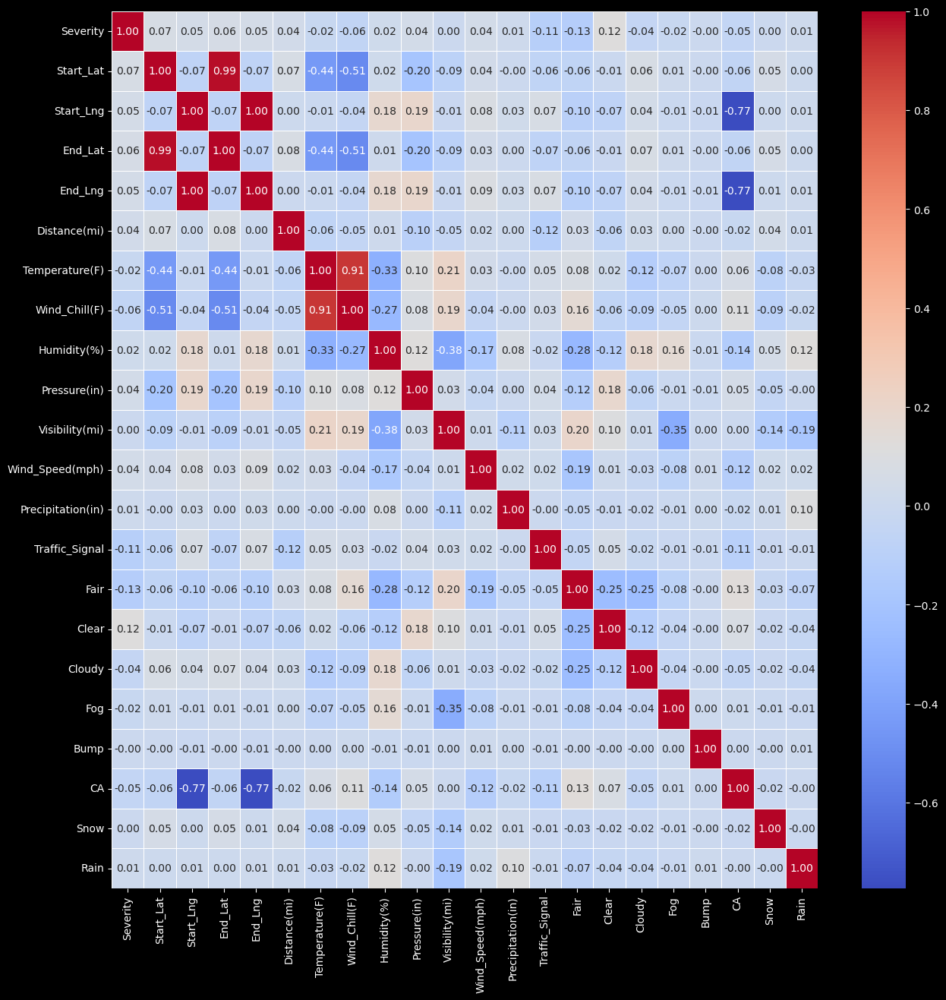

In [39]:
#correlation matrix 
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidth=0.5)
plt.show()

# Scatter plot

C:\Users\telis\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


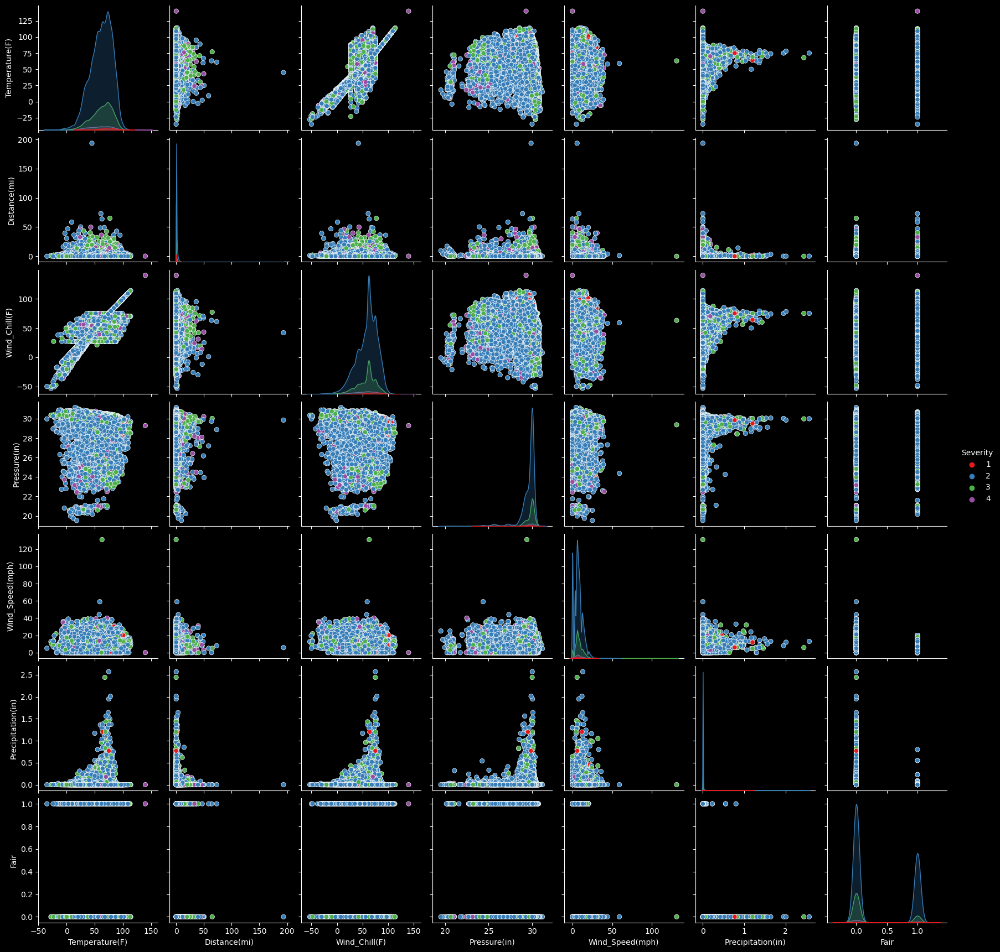

In [38]:
sns.pairplot(data=sample[['Severity', 'Temperature(F)', 'Distance(mi)', 'Wind_Chill(F)', 'Pressure(in)', 'Wind_Speed(mph)', 'Precipitation(in)', 'Fair']], hue='Severity', palette='Set1')

C:\Users\telis\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


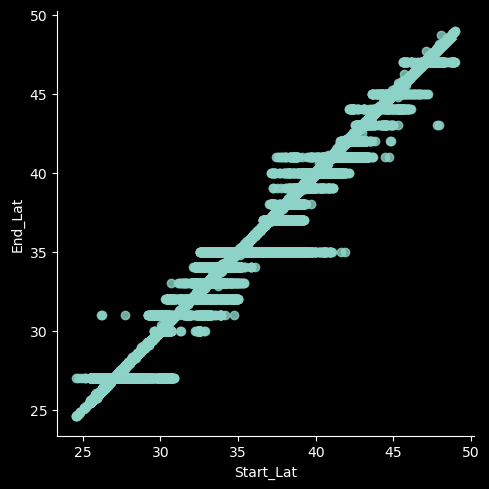

In [36]:
sns.lmplot(x='Start_Lat', y='End_Lat', data=sample)

C:\Users\telis\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\telis\AppData\Local\Temp\ipykernel_34704\3953443080.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


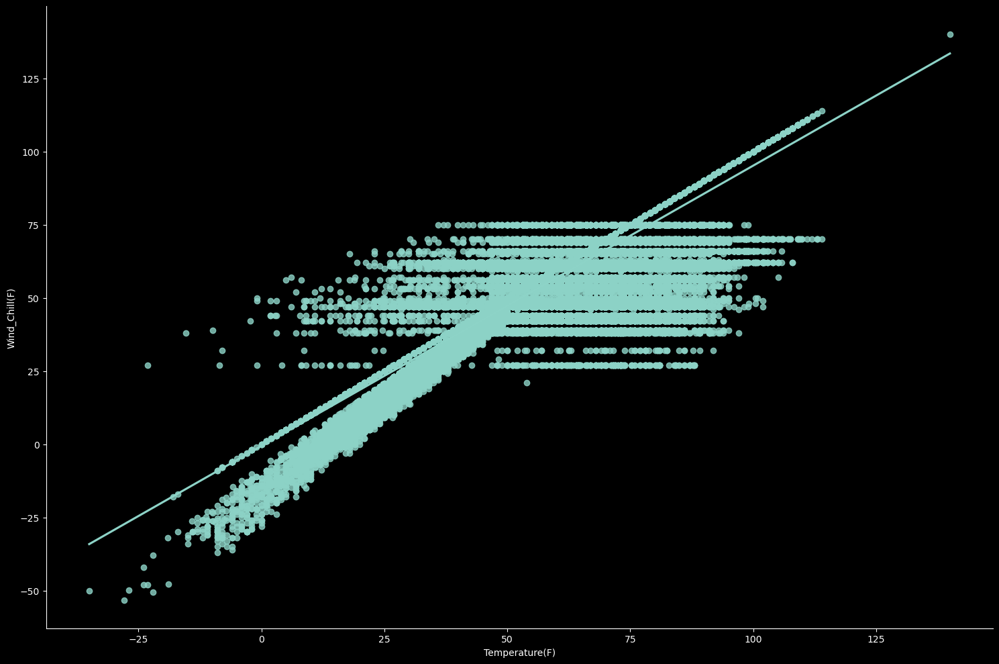

In [59]:
sns.lmplot(x='Temperature(F)', y='Wind_Chill(F)', data=sample, height=10, aspect=1.5)
plt.tight_layout()
plt.show()

<Axes: xlabel='Weather_Condition', ylabel='Severity'>

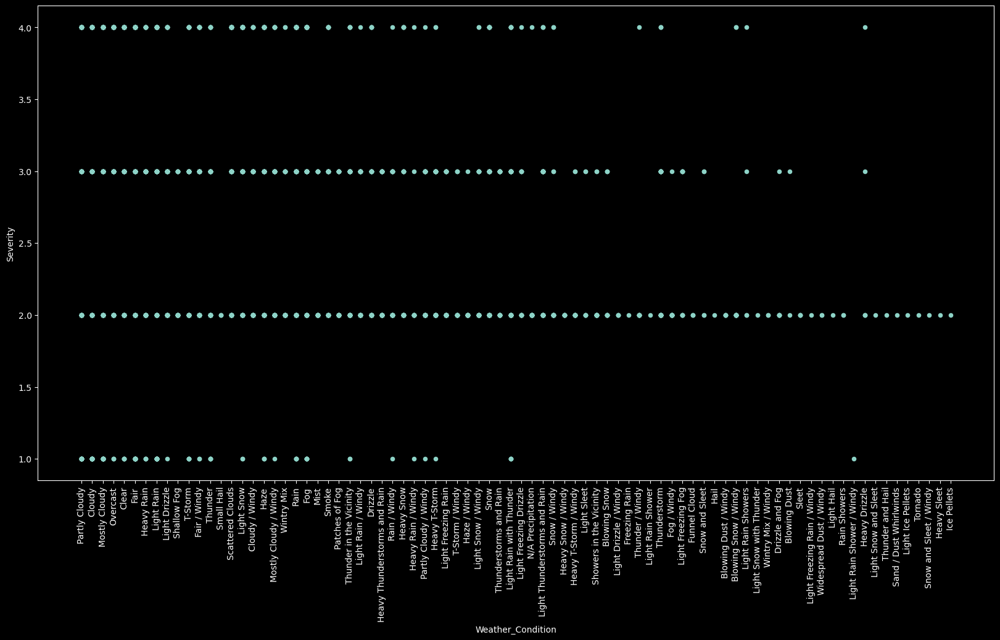

In [51]:
sample.plot.scatter(x='Weather_Condition', y='Severity', rot=90, figsize=(20,10))

C:\Users\telis\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


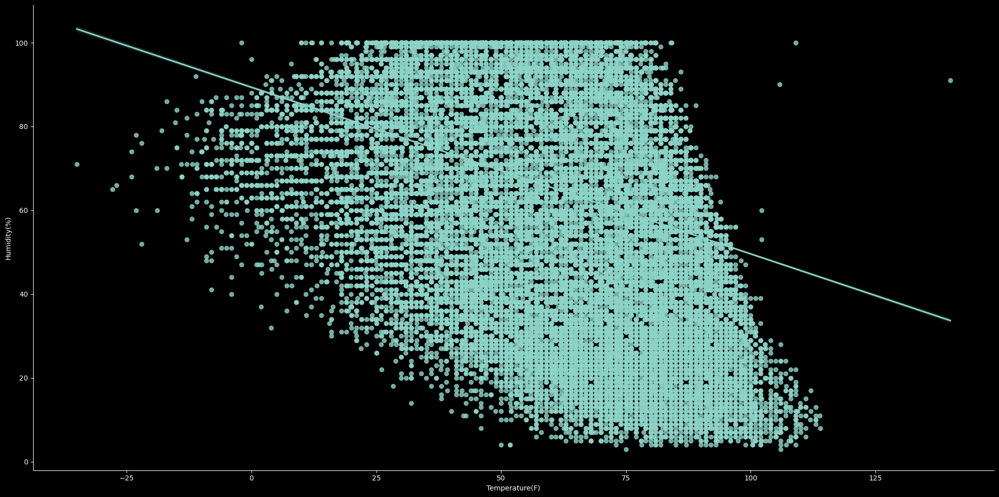

In [60]:
sns.lmplot(x='Temperature(F)', y='Humidity(%)', data=sample, height=10, aspect=2)

# Boxplots

<Axes: >

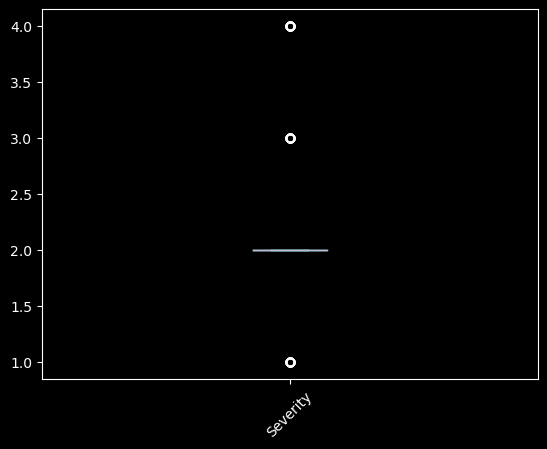

In [47]:
fig, ax = plt.subplots(1,1)
sample[['Severity']].plot.box(ax=ax, rot=45)

<Axes: >

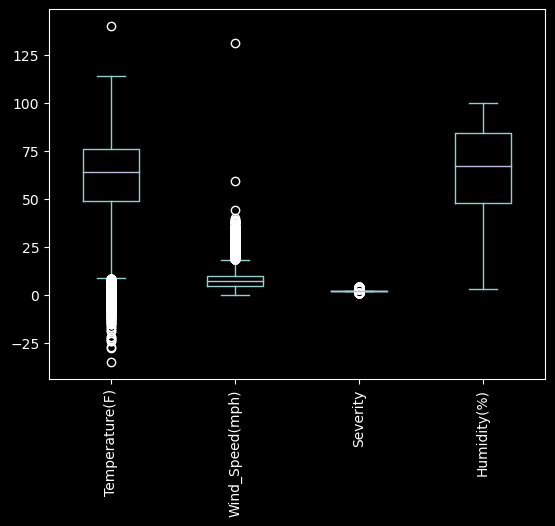

In [49]:
fig, ax = plt.subplots(1,1)
sample[['Temperature(F)', 'Wind_Speed(mph)', 'Severity', 'Wind_Direction', 'Humidity(%)']].plot.box(ax=ax, rot=90)

# Histogramms

C:\Users\telis\AppData\Local\Temp\ipykernel_22272\3652826223.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


[Text(0, 0, 'NJ'),
 Text(1, 0, 'UT'),
 Text(2, 0, 'IL'),
 Text(3, 0, 'FL'),
 Text(4, 0, 'CA'),
 Text(5, 0, 'PA'),
 Text(6, 0, 'GA'),
 Text(7, 0, 'IN'),
 Text(8, 0, 'AR'),
 Text(9, 0, 'TX'),
 Text(10, 0, 'SC'),
 Text(11, 0, 'VA'),
 Text(12, 0, 'CT'),
 Text(13, 0, 'MD'),
 Text(14, 0, 'OR'),
 Text(15, 0, 'MI'),
 Text(16, 0, 'NY'),
 Text(17, 0, 'KY'),
 Text(18, 0, 'NC'),
 Text(19, 0, 'OK'),
 Text(20, 0, 'MN'),
 Text(21, 0, 'MO'),
 Text(22, 0, 'MT'),
 Text(23, 0, 'OH'),
 Text(24, 0, 'WA'),
 Text(25, 0, 'WI'),
 Text(26, 0, 'NV'),
 Text(27, 0, 'TN'),
 Text(28, 0, 'LA'),
 Text(29, 0, 'CO'),
 Text(30, 0, 'MA'),
 Text(31, 0, 'AL'),
 Text(32, 0, 'IA'),
 Text(33, 0, 'DC'),
 Text(34, 0, 'NE'),
 Text(35, 0, 'AZ'),
 Text(36, 0, 'MS'),
 Text(37, 0, 'WV'),
 Text(38, 0, 'RI'),
 Text(39, 0, 'NH'),
 Text(40, 0, 'KS'),
 Text(41, 0, 'DE'),
 Text(42, 0, 'NM'),
 Text(43, 0, 'ID'),
 Text(44, 0, 'ND'),
 Text(45, 0, 'WY'),
 Text(46, 0, 'ME'),
 Text(47, 0, 'VT'),
 Text(48, 0, 'SD')]

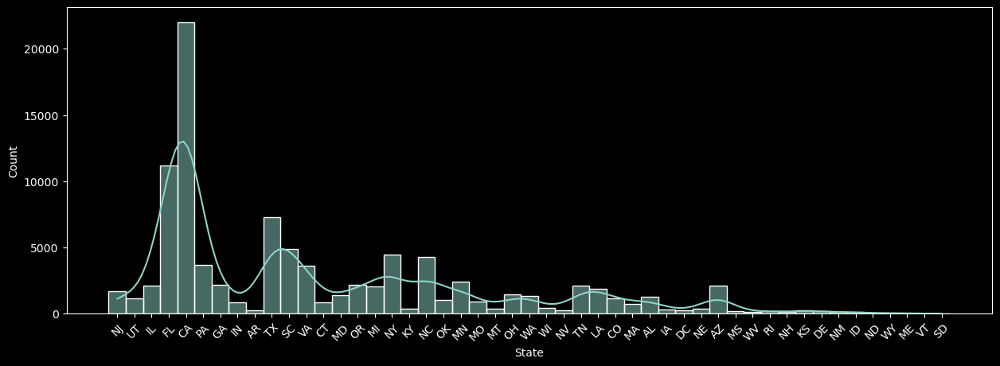

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(15,5))
plot = sns.histplot(sample['State'], ax=ax, kde=True)

plot.set_xticklabels(plot.get_xticklabels(), rotation=45)

<Axes: xlabel='Start_Time', ylabel='Count'>

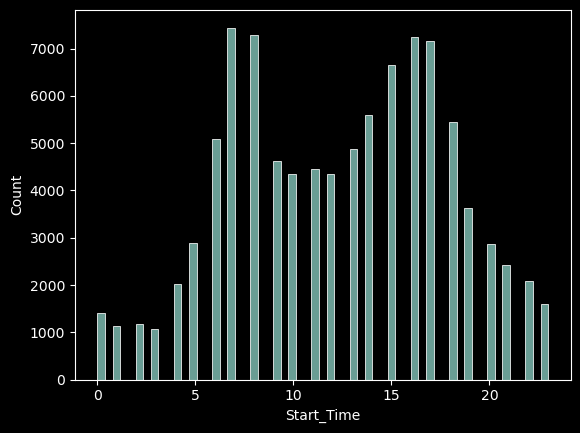

In [31]:
sample['Start_Time'] = pd.to_datetime(sample['Start_Time'], format='ISO8601')
sns.histplot(sample['Start_Time'].dt.hour)

<Axes: xlabel='Start_Time', ylabel='Count'>

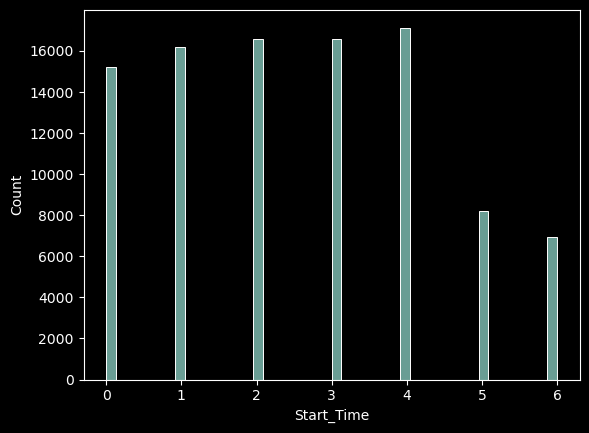

In [32]:
sample['Start_Time'] = pd.to_datetime(sample['Start_Time'], format='ISO8601')
sns.histplot(sample['Start_Time'].dt.dayofweek)

Text(0, 0.5, 'Accidents')

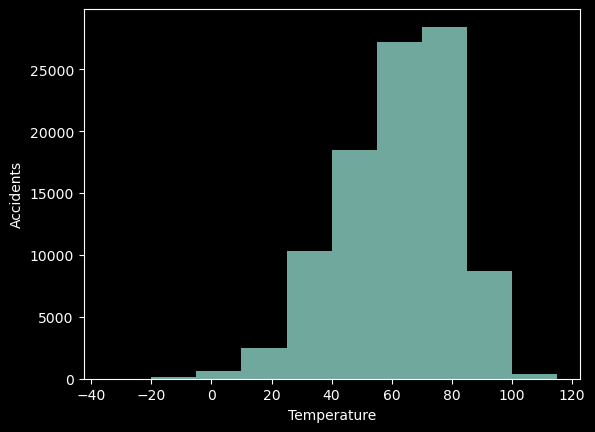

In [34]:
fig, ax = plt.subplots(1,1)

sample['Temperature(F)'].plot.hist(alpha=.8, ax=ax)
ax.set_xlabel('Temperature')
ax.set_ylabel('Accidents')

Text(0, 0.5, 'Accidents')

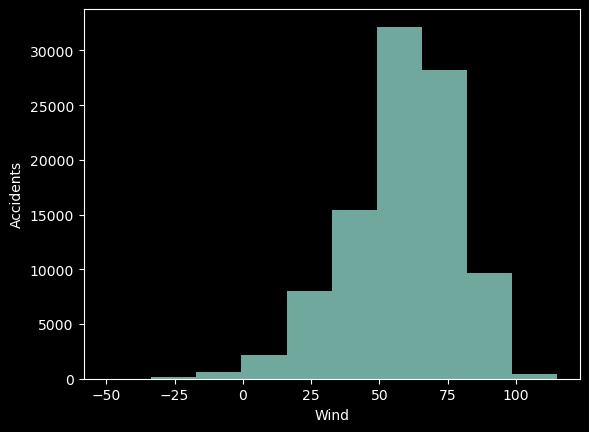

In [36]:
fig, ax = plt.subplots(1,1)

sample['Wind_Chill(F)'].plot.hist(alpha=.8, ax=ax)
ax.set_xlabel('Wind')
ax.set_ylabel('Accidents')

Text(0, 0.5, 'Accidents')

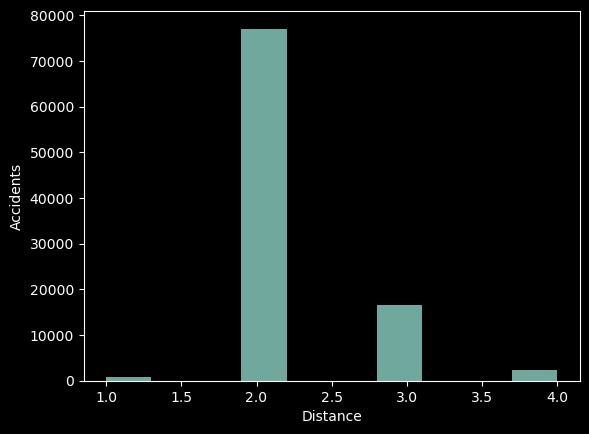

In [93]:
fig, ax = plt.subplots(1,1)

sample['Severity'].plot.hist(alpha=.8, ax=ax)
ax.set_xlabel('Distance')
ax.set_ylabel('Accidents')

Text(0, 0.5, 'Accidents')

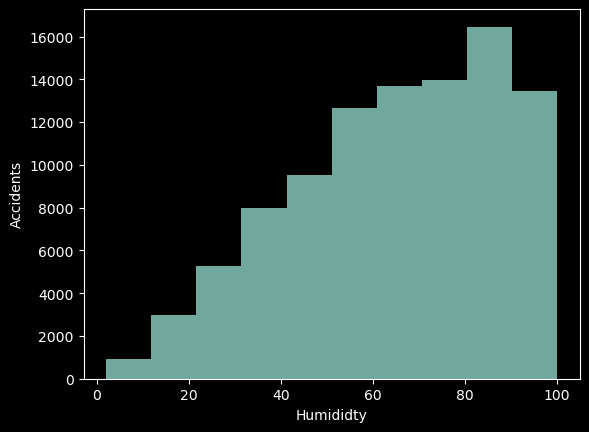

In [52]:
fig, ax = plt.subplots(1,1)

sample['Humidity(%)'].plot.hist(alpha=.8, ax=ax)
ax.set_xlabel('Humididty')
ax.set_ylabel('Accidents')

Text(0, 0.5, 'Accidents')

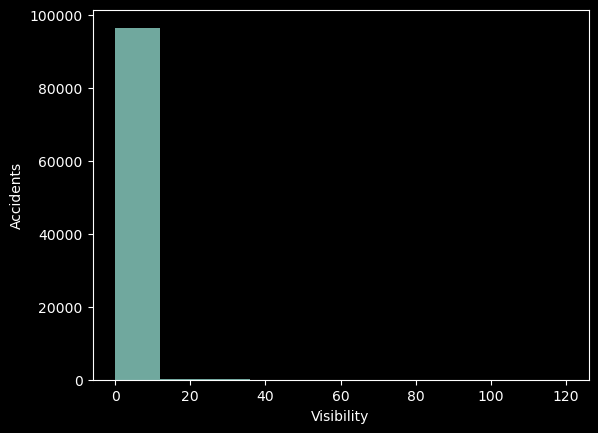

In [72]:
fig, ax = plt.subplots(1,1)

sample['Visibility(mi)'].plot.hist(alpha=.8, ax=ax)
ax.set_xlabel('Visibility')
ax.set_ylabel('Accidents')

Text(0, 0.5, 'Accidents')

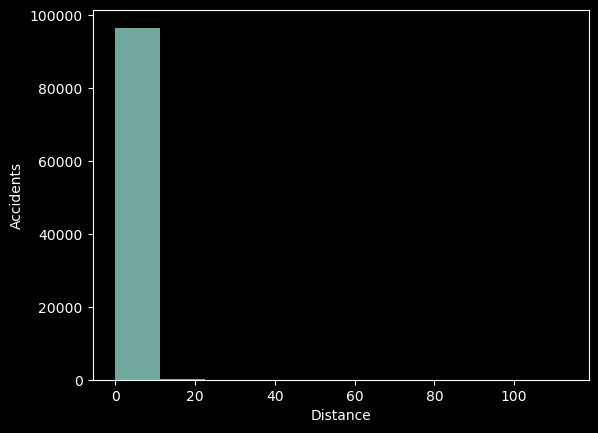

In [6]:
fig, ax = plt.subplots(1,1)

sample['Distance(mi)'].plot.hist(alpha=.8, ax=ax)
ax.set_xlabel('Distance')
ax.set_ylabel('Accidents')

<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


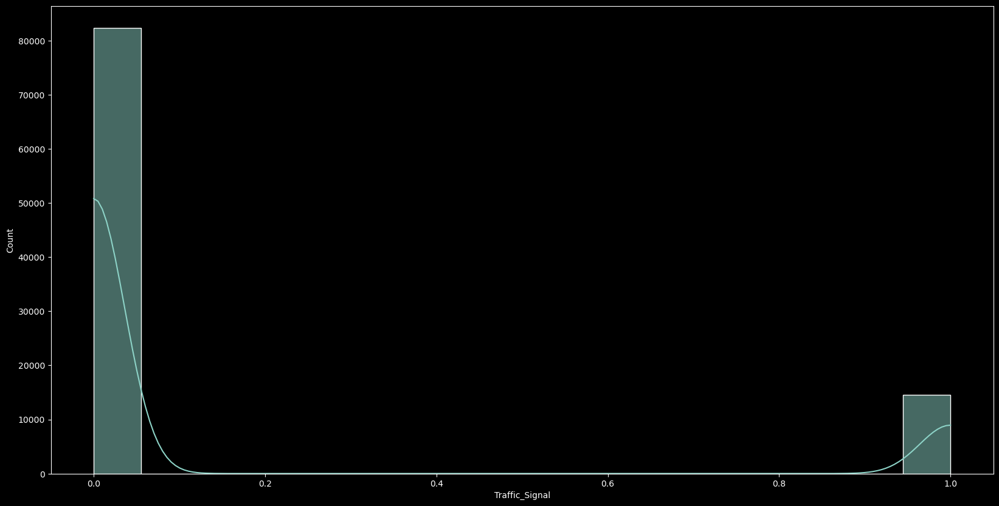

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(20,10))
plot = sns.histplot(sample['Traffic_Signal'], ax=ax, kde=True)

# Pie charts

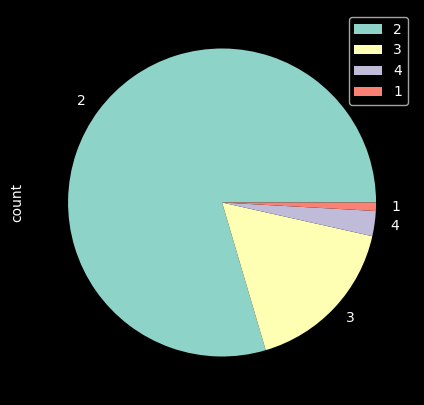

In [61]:
out = sample.Severity.value_counts(sort=True)

fig, ax = plt.subplots(1,1, figsize=(5,5))
out.plot.pie(legend=True, ax=ax)
plt.show()

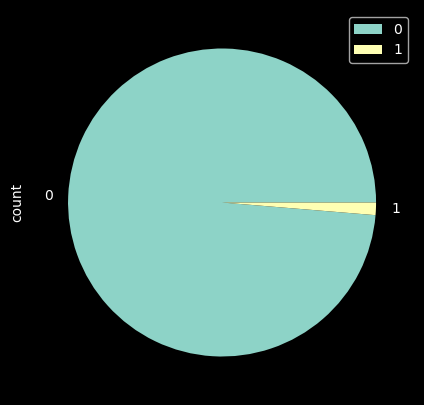

In [45]:
out = sample['Fog'].value_counts(sort=True)

fig, ax = plt.subplots(1,1, figsize=(5,5))
out.plot.pie(legend=True, ax=ax)
plt.show()

# Visualize Data

In [10]:
!pip install geopandas
!pip install contextily
import geopandas as gpd
import contextily as ctx

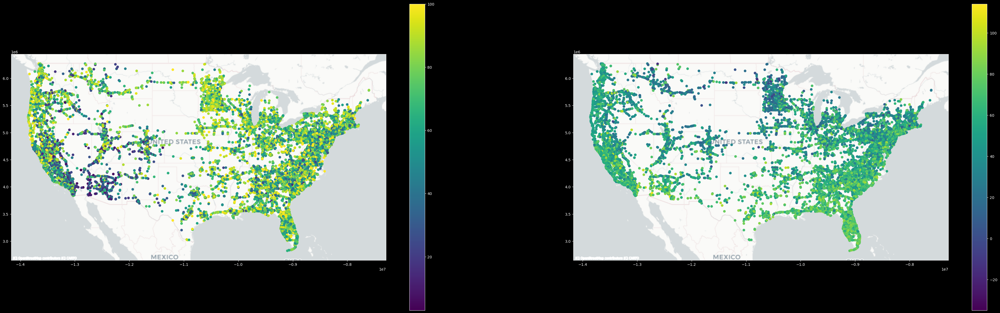

In [19]:
data_geom = gpd.GeoDataFrame(sample, crs='epsg:4326', geometry=gpd.points_from_xy(sample['Start_Lng'], sample['Start_Lat']))

fig, ax = plt.subplots(1, 2, figsize=(50, 15))

# PLOT #1
data_geom.to_crs(epsg=3857).plot(ax=ax[0], column='Humidity(%)', legend=True)
ctx.add_basemap(ax=ax[0], source=ctx.providers.CartoDB.Positron)

# PLOT #2
data_geom.to_crs(epsg=3857).plot(ax=ax[1], column='Temperature(F)', cmap='viridis', legend=True)
ctx.add_basemap(ax=ax[1], source=ctx.providers.CartoDB.Positron)


plt.savefig('data1.png', dpi=300)
plt.show()

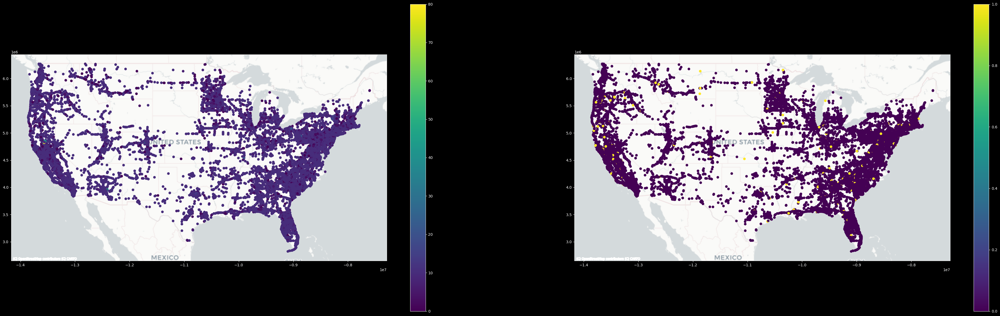

In [27]:
data_geom = gpd.GeoDataFrame(sample, crs='epsg:4326', geometry=gpd.points_from_xy(sample['Start_Lng'], sample['Start_Lat']))

fig, ax = plt.subplots(1, 2, figsize=(50, 15))

# PLOT #1
data_geom.to_crs(epsg=3857).plot(ax=ax[0], column='Visibility(mi)', legend=True)
ctx.add_basemap(ax=ax[0], source=ctx.providers.CartoDB.Positron)

# PLOT #2
data_geom.to_crs(epsg=3857).plot(ax=ax[1], column='Fog', cmap='viridis', legend=True)
ctx.add_basemap(ax=ax[1], source=ctx.providers.CartoDB.Positron)


plt.savefig('data1.png', dpi=300)
plt.show()

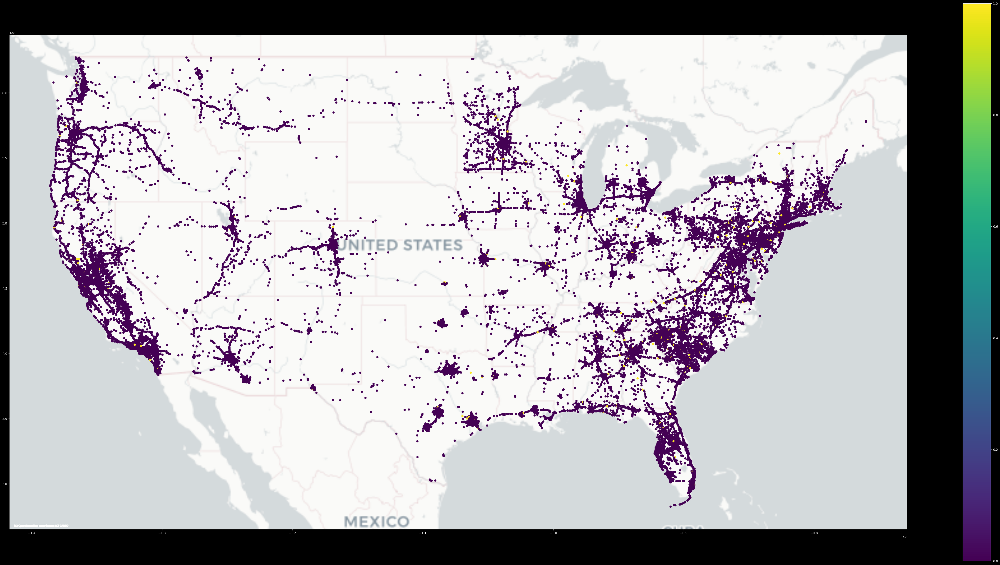

In [44]:
data_geom = gpd.GeoDataFrame(sample, crs='epsg:4326', geometry=gpd.points_from_xy(sample['Start_Lng'], sample['Start_Lat']))

fig, ax = plt.subplots(1, 1, figsize=(50, 25))

# PLOT #1
data_geom.to_crs(epsg=3857).plot(ax=ax, column='Rain', cmap='viridis', legend=True)
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron)


plt.savefig('data1.png', dpi=300)
plt.tight_layout()
plt.show()

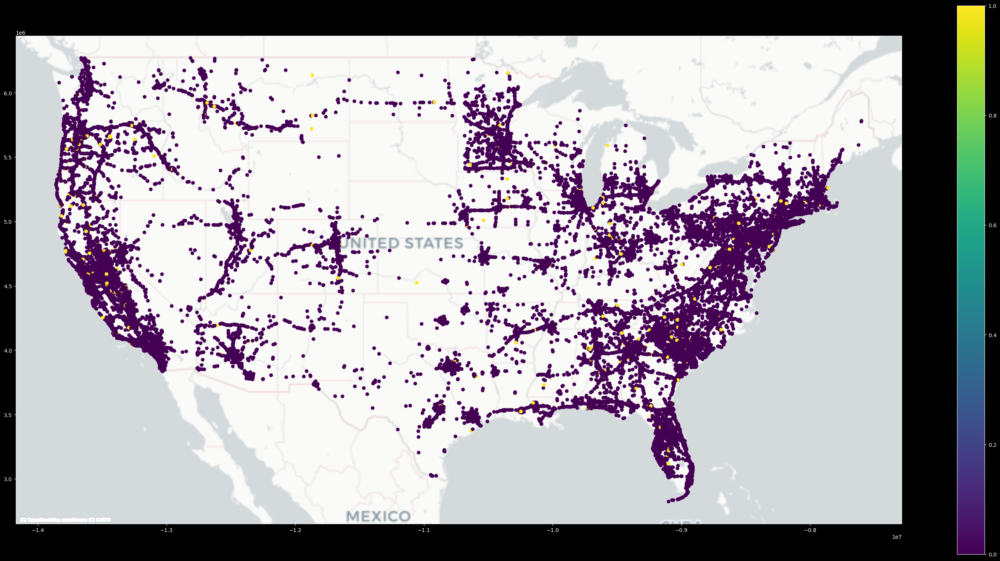

In [38]:
data_geom = gpd.GeoDataFrame(sample, crs='epsg:4326', geometry=gpd.points_from_xy(sample['Start_Lng'], sample['Start_Lat']))

fig, ax = plt.subplots(1, 1, figsize=(30, 15))

# PLOT #1
data_geom.to_crs(epsg=3857).plot(ax=ax, column='Fog', cmap='viridis', legend=True)
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron)


plt.savefig('data1.png', dpi=300)
plt.tight_layout()
plt.show()

# Remove outliers 

In [10]:
sample.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
count,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,...,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000,96972.000000
mean,2.209947,36.197303,-94.701696,35.992096,-94.444003,0.564722,61.703060,58.500029,64.866920,29.545026,...,0.000041,0.022883,0.075228,0.011962,0.037887,0.000124,0.014994,0.004290,0.001743,0.000443
std,0.482278,5.093973,17.401056,5.032313,17.379535,1.696299,18.924649,20.077880,22.762448,0.986926,...,0.006422,0.149531,0.263760,0.108716,0.190924,0.011124,0.121529,0.065357,0.041710,0.021053
min,1.000000,24.562117,-124.497420,24.575290,-124.497419,0.000000,-35.000000,-51.300000,2.000000,2.990000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,33.398660,-117.242961,33.000000,-117.355692,0.000000,49.000000,47.000000,48.000000,29.370000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,35.809269,-87.738827,35.000000,-87.000000,0.027000,64.000000,62.000000,67.000000,29.850000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.000000,40.091744,-80.368109,40.000000,-80.385538,0.465000,76.000000,73.000000,84.000000,30.030000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,4.000000,48.991585,-67.606875,48.998901,-67.626605,82.254000,140.000000,140.000000,100.000000,30.960000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [11]:
feat = 'Temperature(F)'

q25, q75 = sample.describe()[feat][['25%', '75%']]
iqr = q75 - q25
iqr

27.0

In [12]:
~sample['Temperature(F)'].between(q25 - 1.5*iqr, q75 + 1.5*iqr, inclusive='neither')

454635    False
458631    False
437287    False
15207     False
214348    False
          ...  
42041     False
103137    False
413040    False
271098    False
16953     False
Name: Temperature(F), Length: 96972, dtype: bool

In [12]:
outliers = sample.loc[~sample['Temperature(F)'].between(q25 - 1.5*iqr, q75 + 1.5*iqr, inclusive='both')].copy()
outliers

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
363804,0,Source1,2,2022-01-25 09:11:41.000000000,2022-01-25 11:13:25.000000000,44.917324,-93.349914,44.918778,-93.349658,0.101,...,0,0,0,0,0,0,0,0,0,0
29847,0,Source1,2,2022-02-04 08:23:30,2022-02-04 09:04:30,42.339866,-88.092589,42.342854,-88.079598,0.695,...,0,0,0,0,0,0,0,0,0,0
310234,0,Source1,2,2022-12-24 05:44:00,2022-12-24 07:40:27,43.136501,-75.270478,43.137208,-75.276342,0.300,...,0,0,0,0,0,0,0,0,0,0
247101,0,Source1,2,2022-01-02 07:31:36,2022-01-02 09:31:43,43.949474,-94.171436,43.945843,-94.171353,0.251,...,0,0,0,0,0,0,0,0,0,0
49675,0,Source1,2,2021-02-09 14:46:55.000000,2021-02-09 16:01:56.000000,44.800561,-93.221708,44.808521,-93.219188,0.564,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197988,0,Source2,3,2019-01-29 06:19:24,2019-01-29 06:48:49,43.081112,-87.920441,43.000000,-88.000000,0.000,...,0,0,0,0,0,0,0,1,0,0
156184,0,Source1,2,2020-01-18 09:28:00,2020-01-18 13:01:09,45.266390,-93.719930,45.266390,-93.719930,0.000,...,0,0,0,0,0,0,0,0,0,0
449076,0,Source1,2,2022-12-21 06:56:10,2022-12-21 08:13:26,46.118983,-114.178665,46.119004,-114.178915,0.012,...,0,0,0,0,0,0,0,0,0,0
360920,0,Source1,2,2023-02-21 23:26:30,2023-02-21 23:43:30,45.903387,-111.808796,45.878906,-111.897256,4.578,...,0,0,0,0,0,0,0,0,0,0


In [13]:
feats=['Severity',
       'Start_Lat',
       'Start_Lng',
       'End_Lat',
       'End_Lng',
       'Distance(mi)',
       'Temperature(F)',
       'Wind_Chill(F)',
       'Humidity(%)',
       'Pressure(in)',
       'Visibility(mi)',
       'Wind_Speed(mph)',
       'Precipitation(in)',
       'Fair',
       'Bump',
       'CA',
       'Clear',
       'Fog',
       'Rain',
       'Snow']

sample[feats].drop(outliers.index).to_csv('accidents_clean.csv', header=True, index=False)
clear = pd.read_csv('accidents_clean.csv')
clear

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in),Fair,Bump,CA,Clear,Fog,Rain,Snow
0,3,32.662308,-96.822899,31.000000,-96.000000,0.000,91.9,67.0,35.0,29.77,10.0,15.0,0.00,0,False,0,1,0,0,0
1,2,36.960798,-121.550897,36.960798,-121.550897,0.000,41.0,41.0,87.0,29.67,10.0,0.0,0.00,0,False,1,0,0,0,0
2,2,46.288831,-93.824836,46.290106,-93.825202,0.090,30.0,19.0,59.0,28.85,8.0,16.0,0.00,0,False,0,0,0,0,0
3,2,40.615108,-122.519508,35.000000,-119.000000,0.000,41.0,62.0,100.0,29.99,7.0,6.0,0.03,0,False,1,0,0,0,0
4,2,32.834728,-96.898125,31.000000,-96.000000,0.000,80.0,80.0,54.0,29.31,10.0,12.0,0.00,0,False,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96182,2,36.327249,-119.343935,36.327259,-119.339295,0.258,83.0,83.0,32.0,29.48,10.0,8.0,0.00,1,False,1,0,0,0,0
96183,2,32.802873,-96.626514,32.843128,-96.634243,2.817,90.0,90.0,49.0,29.59,10.0,9.0,0.00,1,False,0,0,0,0,0
96184,2,29.837557,-95.371597,31.000000,-96.000000,0.010,44.6,36.6,61.0,30.45,10.0,19.6,0.00,0,False,0,0,0,0,0
96185,3,34.065979,-118.216400,35.000000,-119.000000,0.010,59.0,62.0,75.0,29.86,10.0,6.0,0.12,0,False,1,0,0,0,0


# Clustering

In [16]:
import numpy as np
import pandas as pd

import sklearn
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OrdinalEncoder
from sklearn.decomposition import PCA

import seaborn as sns
from matplotlib import pyplot as plt
plt.style.use('dark_background')

In [17]:
numeric_data = clear[['Severity', 'Start_Lat', 'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)', 'CA', 'Bump', 'Fog', 'Clear', 'Rain', 'Snow', 'Fair']]
target = ['Severity']

#normalize the numeric features so they are on the same scale 
X, y = numeric_data, clear[target[0]]
# MinMaxScaler 
scaler = MinMaxScaler(feature_range=(0, 1), clip=True)
# scaler = StandardScaler()
oenc = OrdinalEncoder()

X_scaled = scaler.fit_transform(X)
y_enc = oenc.fit_transform(y.values.reshape(-1,1))

In [21]:
# without inertias
kmeans = KMeans(n_clusters=y.nunique(), random_state=42)
kmeans.fit(X=X_scaled, y=y_enc)

KMeans(n_clusters=4, random_state=42)

In [18]:
pca = PCA(n_components=2).fit(X_scaled)
X_scaled_2d = pca.transform(X_scaled)
X_scaled_2d

array([[-0.18505733,  0.44367281],
       [ 0.81445504,  0.63312031],
       [-0.2899699 ,  0.29095191],
       ...,
       [-0.24313213,  0.21463106],
       [ 0.78134472,  0.58578967],
       [-0.43984776,  0.07528562]])

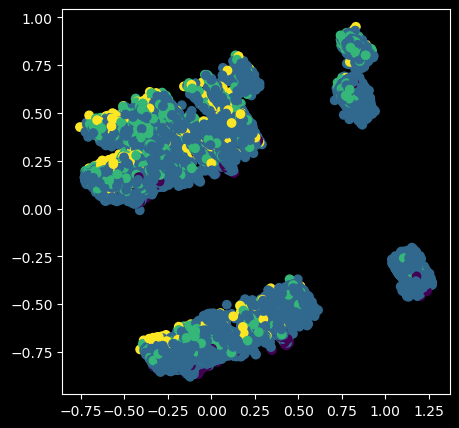

In [19]:
fig, ax = plt.subplots(1,1, figsize=(5,5))
ax.scatter(X_scaled_2d[:,0], X_scaled_2d[:,1], c=y_enc)

In [22]:
kmeans.predict(X_scaled)
kmeans.cluster_centers_.shape

(4, 20)

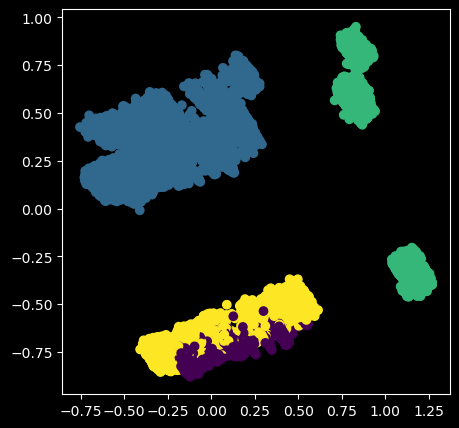

In [23]:
fig, ax = plt.subplots(1,1, figsize=(5,5))
ax.scatter(X_scaled_2d[:,0], X_scaled_2d[:,1], c=kmeans.predict(X_scaled))

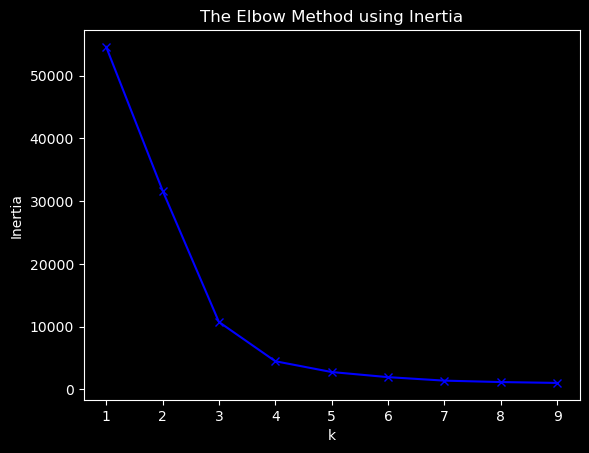

In [24]:
# ELBOW
wcss = []
K = range(1, 10)
  
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(X_scaled_2d)
    kmeanModel.fit(X_scaled_2d)
    wcss.append(kmeanModel.inertia_)
    
plt.plot(K, wcss, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')

plt.show()

In [26]:
kmeans1 = KMeans(n_clusters=4, random_state=42)
kmeans1.fit(X=X_scaled_2d)
y_kmeans1 = kmeans1.predict(X_scaled_2d)
print(kmeans1.labels_)

[1 2 1 ... 1 2 1]


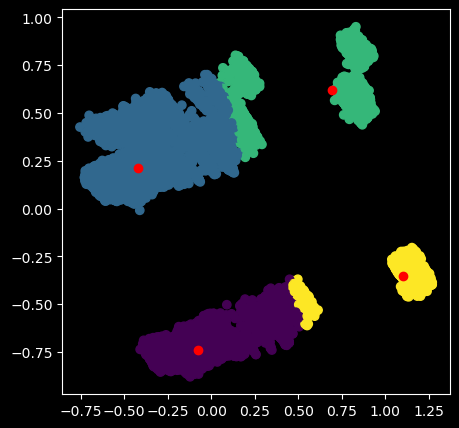

In [27]:
fig, ax = plt.subplots(1,1, figsize=(5,5))
plt.scatter(X_scaled_2d[:,0], X_scaled_2d[:,1], c=y_kmeans1) 
centers = kmeans1.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red')
plt.show()


# location

In [63]:
target_l = ['State']
X_l, y_l = clear[['Start_Lng', 'Start_Lat']], clear[target[0]]

In [64]:
# MinMaxScaler 
scaler = MinMaxScaler(feature_range=(0, 1), clip=True)
# scaler = StandardScaler()
oenc = OrdinalEncoder()

X_l_scaled = scaler.fit_transform(X_l)
y_l_enc = oenc.fit_transform(y_l.values.reshape(-1,1))

In [65]:
X_l_scaled

array([[0.70351952, 0.37644979],
       [0.12294632, 0.94386071],
       [0.31391953, 0.42825357],
       ...,
       [0.77954377, 0.06257418],
       [0.74908511, 0.69072568],
       [0.89134862, 0.74179483]])

In [66]:
kmeans = KMeans(n_clusters=y_l.nunique(), random_state=42)
kmeans.fit(X=X_l_scaled, y=y_l_enc)

KMeans(n_clusters=4, random_state=42)

In [67]:
kmeans.predict(X_l_scaled)

array([3, 1, 1, ..., 2, 0, 0])

In [68]:
y_l_enc.shape, kmeans.predict(X_l_scaled).shape

((96315, 1), (96315,))

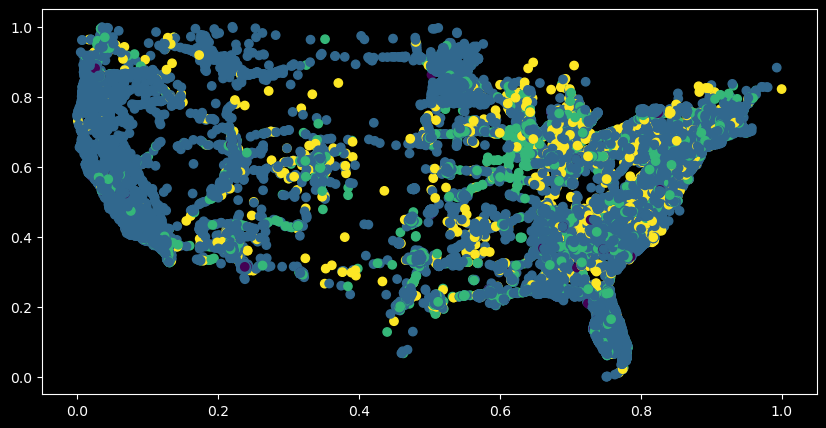

In [69]:
fig, ax = plt.subplots(1,1, figsize=(10,5))
ax.scatter(X_l_scaled[:,0], X_l_scaled[:,1], c=y_l_enc)

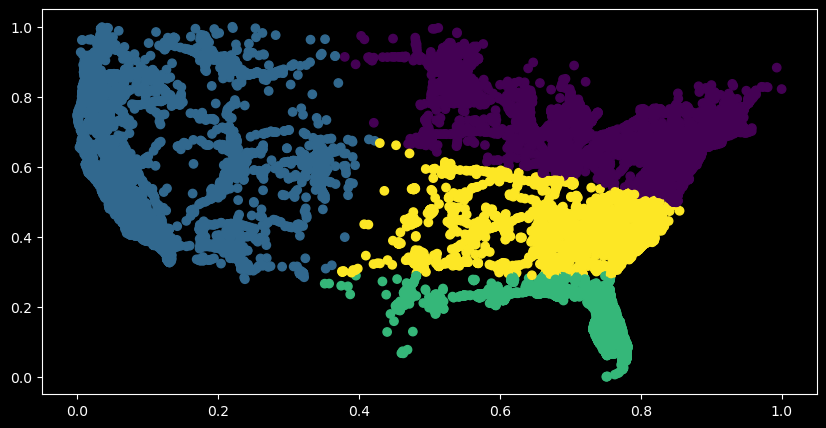

In [70]:
fig, ax = plt.subplots(1,1, figsize=(10,5))
ax.scatter(X_l_scaled[:,0], X_l_scaled[:,1], c=kmeans.predict(X_l_scaled))

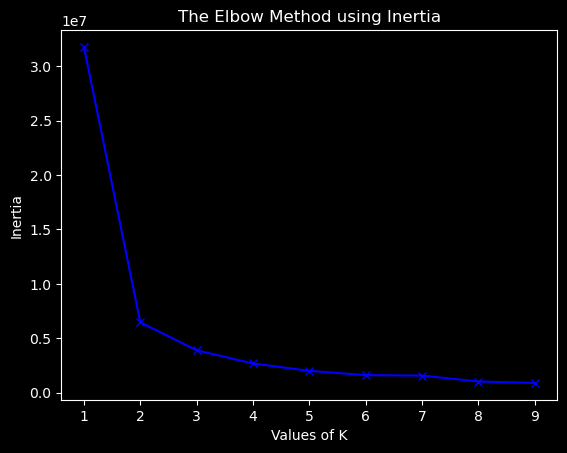

In [71]:
# ELBOW CRITERION
inertias = []
K = range(1, 10)
  
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(X_l)
    kmeanModel.fit(X_l)
    inertias.append(kmeanModel.inertia_)
    
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

In [72]:
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X=X_l_scaled, y=y_l_enc)

KMeans(n_clusters=3, random_state=42)

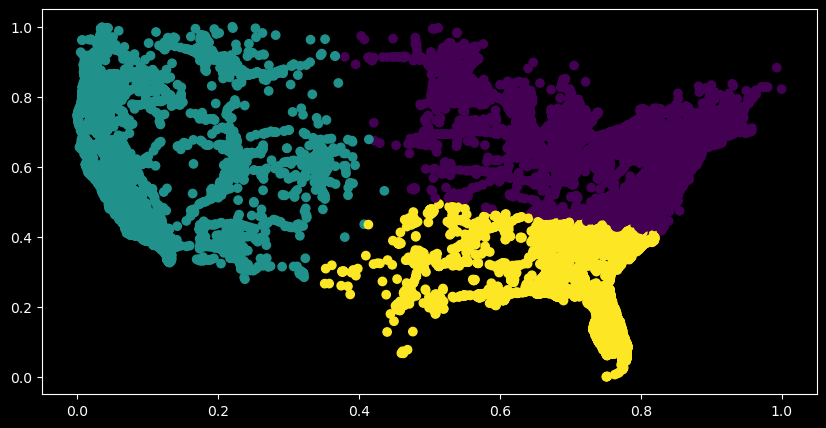

In [73]:
fig, ax = plt.subplots(1,1, figsize=(10,5))
ax.scatter(X_l_scaled[:,0], X_l_scaled[:,1], c=kmeans.predict(X_l_scaled))

# DBSCAN

Text(0, 0.5, 'Distance')

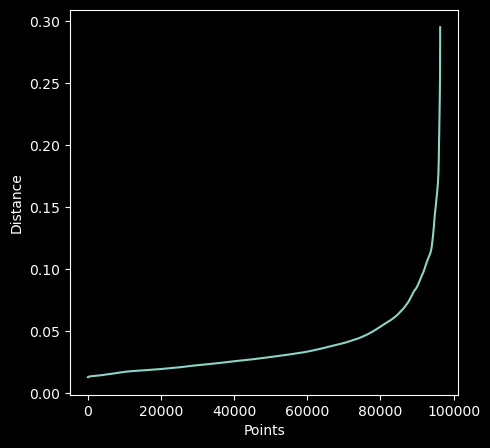

In [57]:
from sklearn.neighbors import NearestNeighbors


nearest_neighbors = NearestNeighbors(n_neighbors=1000)
neighbors = nearest_neighbors.fit(X_scaled_2d)

distances, indices = neighbors.kneighbors(X_scaled_2d)
distances = np.sort(distances[:,999], axis=0)


fig = plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")

0.05874592958401176


<Figure size 500x500 with 0 Axes>

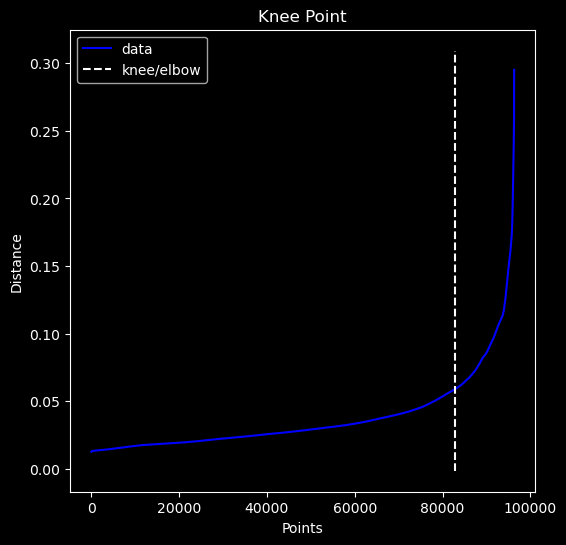

In [58]:
from kneed import KneeLocator

i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print(distances[knee.knee])

In [59]:
dbscan = DBSCAN(eps=0.05874592958401176, n_jobs=-1)
dbscan.fit(X_scaled_2d)

DBSCAN(eps=0.05874592958401176, n_jobs=-1)

In [60]:
# Number of clusters
labels = dbscan.labels_
N_clus=len(set(labels))-(1 if -1 in labels else 0)
print('Estimated no. of clusters:%d' % N_clus)

Estimated no. of clusters:4


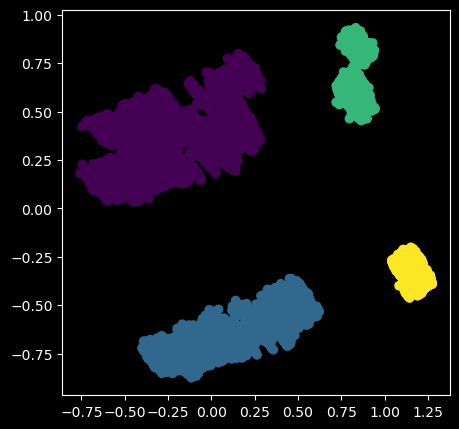

In [61]:
ig, ax = plt.subplots(1,1, figsize=(5,5))

ax.scatter(X_scaled_2d[:, 0], X_scaled_2d[:, 1], c=dbscan.labels_)

Text(0, 0.5, 'Distance')

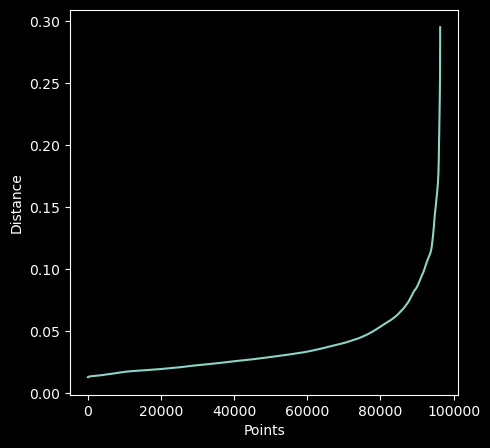

In [74]:
from sklearn.neighbors import NearestNeighbors


nearest_neighbors_l = NearestNeighbors(n_neighbors=1000)
neighbors_l = nearest_neighbors_l.fit(X_l_scaled)

distances_l, indices_l = neighbors_l.kneighbors(X_l_scaled)
distances_l = np.sort(distances_l[:,999], axis=0)


fig = plt.figure(figsize=(5, 5))
plt.plot(distances)
plt.xlabel("Points")
plt.ylabel("Distance")

0.06054446419671849


<Figure size 500x500 with 0 Axes>

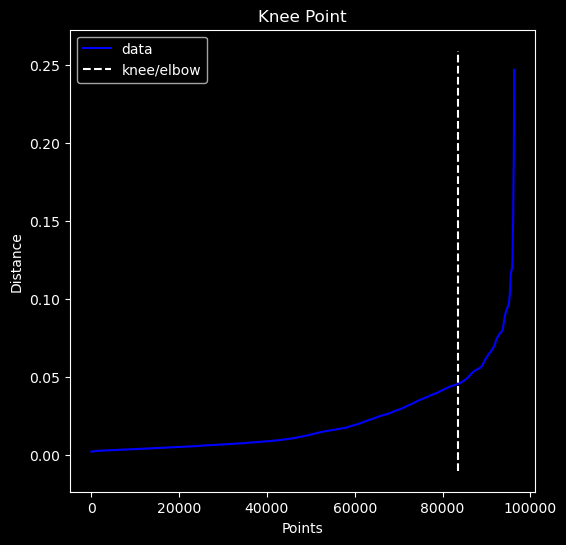

In [75]:
from kneed import KneeLocator

i = np.arange(len(distances_l))
knee = KneeLocator(i, distances_l, S=1, curve='convex', direction='increasing', interp_method='polynomial')

fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")

print(distances[knee.knee])

In [76]:
dbscan1 = DBSCAN(eps=0.06054446419671849, n_jobs=-1)
dbscan1.fit(X_l_scaled)

DBSCAN(eps=0.06054446419671849, n_jobs=-1)

In [77]:
# Number of clusters
labels = dbscan1.labels_
N_clus=len(set(labels))-(1 if -1 in labels else 0)
print('Estimated no. of clusters:%d' % N_clus)

Estimated no. of clusters:1


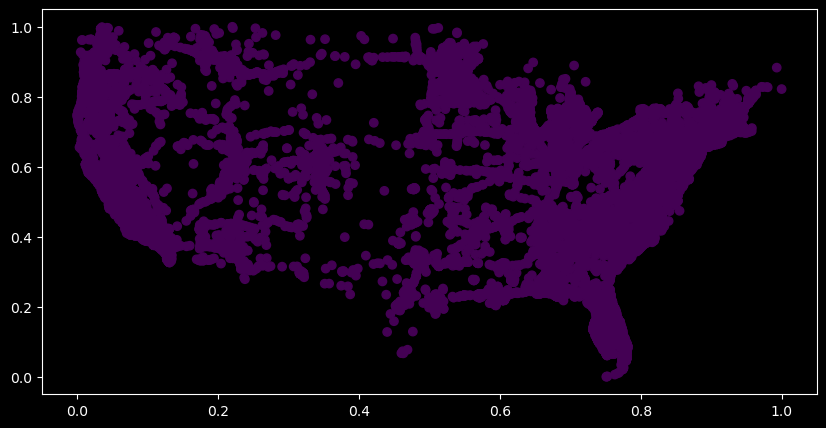

In [78]:
ig, ax = plt.subplots(1,1, figsize=(10,5))

ax.scatter(X_l_scaled[:, 0], X_l_scaled[:, 1], c=dbscan1.labels_)

# Classification

In [28]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Assume your features are stored in X and your target variable in y
features = ['Start_Lat', 'Start_Lng', 'Distance(mi)', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)', 'Bump', 'CA', 'Fair', 'Clear', 'Rain', 'Snow', 'Fog']
label = ['Severity']
X, y = sample[features].values, sample[label].values
y = y.ravel()
kmeans1_indices = np.where(kmeans1.labels_ == 0)[0]
X_1 = X[kmeans1_indices]
y_1 = y[kmeans1_indices]
y_1 = y_1.ravel()
y_1.shape

(21435,)

In [32]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_1, y_1, test_size=0.20, random_state=42)

print ('Training cases: %d\nTest cases: %d' % (X_train.shape[0], X_test.shape[0]))

Training cases: 17148
Test cases: 4287


In [33]:
scaler = MinMaxScaler(feature_range=(0, 1), clip=True)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [105]:
# Initialize and train the classifier
classifier = SVC(kernel='linear', C=1.0, decision_function_shape='ovr', class_weight='balanced', probability=True)
classifier.fit(X_train_scaled, y_train)
#rbf = SVC(kernel='rbf', gamma=0.5, C=0.1).fit(X_train, y_train)

# Predictions
y_pred = classifier.predict(X_test_scaled)

In [106]:
print(np.unique(y_pred))


[1 2 3 4]


In [107]:
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

Confusion Matrix:
 [[  59    5    3    5]
 [2247  883 1315 1489]
 [ 383   69  455  317]
 [  61   14   23   95]]


In [108]:
class_report = classification_report(y_test, y_pred)
print("Classification Report:\n", class_report)

Classification Report:
               precision    recall  f1-score   support

           1       0.02      0.82      0.04        72
           2       0.91      0.15      0.26      5934
           3       0.25      0.37      0.30      1224
           4       0.05      0.49      0.09       193

    accuracy                           0.20      7423
   macro avg       0.31      0.46      0.17      7423
weighted avg       0.77      0.20      0.26      7423



C:\Users\telis\anaconda3\Lib\site-packages\sklearn\metrics\_ranking.py:1146: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\telis\AppData\Local\Temp\ipykernel_11720\1073445969.py:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0, 1], [0, 1], 'k--', color='red')


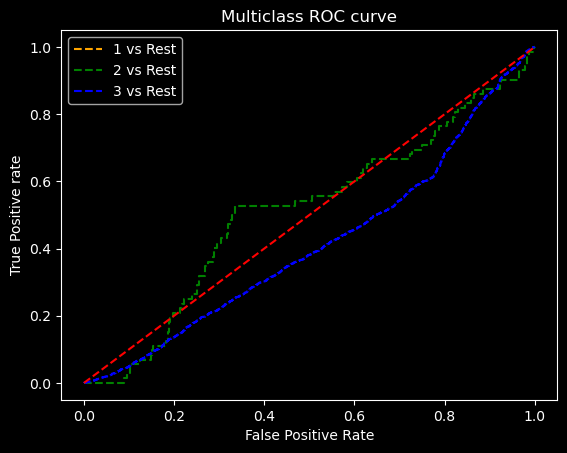

In [110]:
from sklearn.metrics import roc_auc_score, roc_curve
severity_classes=['1', '2', '3', '4']
y_prob = classifier.predict_proba(X_test_scaled)

fpr={}
tpr={}
thresh={}
for i in range(len(severity_classes)):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_prob[:,i], pos_label=i)
    
# Plot the ROC chart
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label=severity_classes[0] + ' vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label=severity_classes[1] + ' vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label=severity_classes[2] + ' vs Rest')
plt.title('Multiclass ROC curve')
plt.plot([0, 1], [0, 1], 'k--', color='red')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show()

In [97]:
auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
print('Average AUC:', auc)

Average AUC: 0.517911710771512


In [130]:
from sklearn.linear_model import LogisticRegression

reg=0.1
multi_model = LogisticRegression(C=1/reg, solver='lbfgs', multi_class='ovr', max_iter=10000).fit(X_train_scaled, y_train)


In [131]:
accs_pred = multi_model.predict(X_test_scaled)
print(np.unique(accs_pred))

[2 3 4]


In [132]:
conf_matrix = confusion_matrix(y_test, accs_pred)
print("Confusion Matrix:\n", conf_matrix)

Confusion Matrix:
 [[   0   72    0    0]
 [   0 5931    2    1]
 [   0 1223    1    0]
 [   0  193    0    0]]


In [133]:
class_report = classification_report(y_test, accs_pred)
print("Classification Report:\n", class_report)

Classification Report:
               precision    recall  f1-score   support

           1       0.00      0.00      0.00        72
           2       0.80      1.00      0.89      5934
           3       0.33      0.00      0.00      1224
           4       0.00      0.00      0.00       193

    accuracy                           0.80      7423
   macro avg       0.28      0.25      0.22      7423
weighted avg       0.69      0.80      0.71      7423



C:\Users\telis\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\telis\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\telis\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


C:\Users\telis\anaconda3\Lib\site-packages\sklearn\metrics\_ranking.py:1146: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\telis\AppData\Local\Temp\ipykernel_11720\3030417575.py:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0, 1], [0, 1], 'k--', color='red')


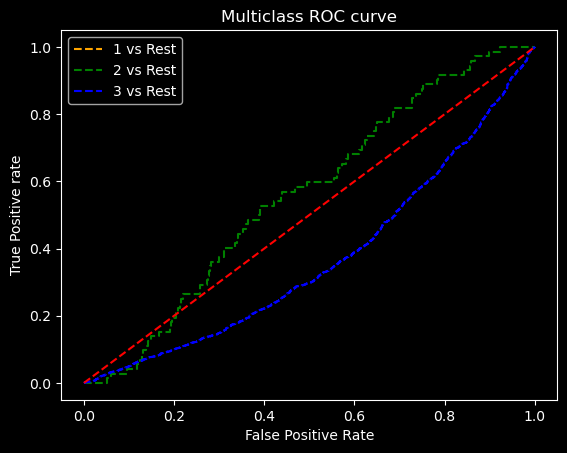

In [125]:
from sklearn.metrics import roc_auc_score, roc_curve
severity_classes=['1', '2', '3', '4']
y_pred = multi_model.predict_proba(X_test_scaled)

fpr={}
tpr={}
thresh={}
for i in range(len(severity_classes)):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_pred[:,i], pos_label=i)
    
# Plot the ROC chart
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label=severity_classes[0] + ' vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label=severity_classes[1] + ' vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label=severity_classes[2] + ' vs Rest')
plt.title('Multiclass ROC curve')
plt.plot([0, 1], [0, 1], 'k--', color='red')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show()

In [126]:
auc = roc_auc_score(y_test, y_pred, multi_class='ovr')
print('Average AUC:', auc)

Average AUC: 0.6881961549404467


In [127]:
sample.Severity.value_counts()

Severity
2    77421
3    16316
4     2426
1      809
Name: count, dtype: int64

In [30]:
!pip install tensorflow
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
import math
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from scipy.spatial.distance import hamming, euclidean, cityblock
from sklearn.metrics import hamming_loss
from sklearn.metrics import accuracy_score

In [34]:
model = Sequential()
model.add(LSTM(50, return_sequences = True, input_shape = (X_train_scaled.shape[1],1)))
model.add(LSTM(50, return_sequences = True))
model.add(LSTM(50))
model.add(Dense(4, activation='softmax'))
model.compile(loss = 'mean_squared_error', optimizer = 'adam', metrics='accuracy')
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 17, 50)            10400     
                                                                 
 lstm_1 (LSTM)               (None, 17, 50)            20200     
                                                                 
 lstm_2 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 4)                 204       
                                                                 
Total params: 51004 (199.23 KB)
Trainable params: 51004 (199.23 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [43]:
model.fit(X_train_scaled, y_train, validation_split = 0.3, epochs = 10, batch_size = 64, verbose=1)

Epoch 1/10
188/188 [==============================] - 7s 38ms/step - loss: 4.1046 - accuracy: 0.1630 - val_loss: 3.9928 - val_accuracy: 0.1625
Epoch 2/10
188/188 [==============================] - 7s 36ms/step - loss: 4.1046 - accuracy: 0.2244 - val_loss: 3.9928 - val_accuracy: 0.8101
Epoch 3/10
188/188 [==============================] - 6s 30ms/step - loss: 4.1046 - accuracy: 0.1830 - val_loss: 3.9928 - val_accuracy: 0.0074
Epoch 4/10
188/188 [==============================] - 6s 34ms/step - loss: 4.1046 - accuracy: 0.1994 - val_loss: 3.9928 - val_accuracy: 0.1044
Epoch 5/10
188/188 [==============================] - 6s 34ms/step - loss: 4.1046 - accuracy: 0.2624 - val_loss: 3.9928 - val_accuracy: 0.1625
Epoch 6/10
188/188 [==============================] - 6s 30ms/step - loss: 4.1046 - accuracy: 0.1721 - val_loss: 3.9928 - val_accuracy: 0.0045
Epoch 7/10
188/188 [==============================] - 6s 34ms/step - loss: 4.1046 - accuracy: 0.3368 - val_loss: 3.9928 - val_accuracy: 0.8101

In [44]:
train_predict = model.predict(X_train_scaled)
test_predict = model.predict(X_test_scaled)
test_labels = np.argmax(test_predict, axis=1)

print(classification_report(test_labels, y_test))
accuracy = model.evaluate(test_predict,y_test)
print(accuracy)

134/134 [==============================] - 2s 12ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1425
           1       0.68      0.01      0.02      2841
           2       0.01      0.86      0.01        21
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0

    accuracy                           0.01      4287
   macro avg       0.14      0.17      0.01      4287
weighted avg       0.45      0.01      0.01      4287

  1/134 [..............................] - ETA: 16s - loss: 3.9062 - accuracy: 0.0000e+00

C:\Users\telis\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\telis\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\telis\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\telis\anaconda3\Lib\site-packages\sklea

134/134 [==============================] - 1s 6ms/step - loss: 4.1263 - accuracy: 0.0089
[4.126297473907471, 0.008864007890224457]
